In [23]:
import numpy as np
import pandas as pd
import pickle
from numba import njit
import os
import random
import folium
import matplotlib.pyplot as plt
from docplex.mp import model
from scipy.spatial.distance import cdist
from sklearn.metrics import silhouette_score, silhouette_samples

In [2]:
postcode = pd.read_csv("C:\\Users\\harsh\\OneDrive\\Desktop\\Summer Project-KMeans\\australian_postcodes.csv")

In [3]:
postcode.head()

,id,postcode,locality,state,long,lat,dc,type,status,sa3,...,altitude,chargezone,phn_code,phn_name,lgaregion,lgacode,electorate,electoraterating,sed_code,sed_name
0,230,200,ANU,ACT,149.11900,-35.277700,NaN,NaN,Updated 3-Dec-2022,NaN,...,NaN,N2,NaN,NaN,Unincorporated ACT,89399.0,Durack,NaN,NaN,NaN
1,21820,200,Australian National University,ACT,149.11890,-35.277700,NaN,NaN,Updated 3-Dec-2022,NaN,...,NaN,N2,NaN,NaN,Unincorporated ACT,89399.0,Durack,NaN,NaN,NaN
2,232,800,DARWIN,NT,130.83668,-12.458684,NaN,NaN,Updated 3-Dec-2022,70101.0,...,NaN,NT1,PHN701,Northern Territory,Darwin Waterfront Precinct,71150.0,Solomon,Inner Metropolitan,70022.0,Port Darwin
3,24049,800,DARWIN CITY,NT,130.83668,-12.458684,NaN,NaN,Updated 3-Dec-2022,70101.0,...,NaN,NT1,PHN701,Northern Territory,Darwin Waterfront Precinct,71150.0,Solomon,Inner Metropolitan,70022.0,Port Darwin
4,233,801,DARWIN,NT,130.83668,-12.458684,NaN,NaN,Updated 3-Dec-2022,70101.0,...,NaN,NT1,PHN701,NaN,Darwin,71000.0,Lingiari,Rural,NaN,NaN


In [4]:
postcode.columns

Index(['id', 'postcode', 'locality', 'state', 'long', 'lat', 'dc', 'type',
       'status', 'sa3', 'sa3name', 'sa4', 'sa4name', 'region', 'Lat_precise',
       'Long_precise', 'SA1_CODE_2021', 'SA1_NAME_2021', 'SA2_CODE_2021',
       'SA2_NAME_2021', 'SA3_CODE_2021', 'SA3_NAME_2021', 'SA4_CODE_2021',
       'SA4_NAME_2021', 'RA_2011', 'RA_2016', 'RA_2021', 'RA_2021_NAME',
       'MMM_2015', 'MMM_2019', 'ced', 'altitude', 'chargezone', 'phn_code',
       'phn_name', 'lgaregion', 'lgacode', 'electorate', 'electoraterating',
       'sed_code', 'sed_name'],
      dtype='object')

In [5]:
# Preprocess data: Extract longitude and latitude
data = postcode[['lat', 'long']].dropna()  # Ensure no missing values
#Removing ouliers and cleaning data

australia_bounds={
    "lat_min": -44,
    "lat_max": -10,
    "long_min": 112,
    "long_max": 154
}

filtered_data= data[
    (data['lat'] >=australia_bounds['lat_min']) &
    (data['lat'] <=australia_bounds['lat_max']) &
    (data['long'] >=australia_bounds['long_min']) &
    (data['long'] <=australia_bounds['long_max'])
]

filtered_data_array = filtered_data.to_numpy()

In [6]:
#Max Distance Initialisation 

def max_distance_init(data, k, seed=42):
    """
    Initialize cluster centers such that the distance between them is maximized.
    Args:
    - data: NumPy array of shape (n_samples, n_features)
    - k: Number of clusters
    - seed: Random seed for reproducibility
    Returns:
    - centers: NumPy array of shape (k, n_features)
    """
    np.random.seed(seed)
    n_samples = data.shape[0]
    
    # Step 1: Randomly select the first center
    centers = [data[np.random.choice(n_samples)]]
    
    # Step 2: Iteratively select centers to maximize distance
    for _ in range(1, k):
        distances = cdist(data, np.array(centers))
        min_distances = np.min(distances, axis=1)
        next_center = data[np.argmax(min_distances)]
        centers.append(next_center)
    
    return np.array(centers)

In [11]:
# K-means++ initialization
def kmeans_pp_init(data, k, seed=30):
    """
    Perform K-means++ initialization.
    Args:
    - data: NumPy array of shape (n_samples, n_features)
    - k: Number of clusters
    - seed: Random seed for reproducibility
    Returns:
    - initial_centers: NumPy array of shape (k, n_features)
    """
    np.random.seed(seed)
    n_samples = data.shape[0]
    
    # Step 1: Randomly select the first center
    centers = [data[np.random.choice(n_samples)]]
    
    # Step 2: Iteratively select the remaining k-1 centers
    for _ in range(1, k):
        # Compute distances to the nearest selected center
        distances = np.min(cdist(data, np.array(centers)), axis=1)
        
        # Compute probabilities proportional to squared distances
        probabilities = distances**2 / np.sum(distances**2)
        
        # Select the next center based on probabilities
        next_center = data[np.random.choice(n_samples, p=probabilities)]
        centers.append(next_center)
    
    return np.array(centers)

In [12]:
# Step: Perform K-means clustering
def kmeans_clustering(data, k, init_centers, max_iters=100, tol=1e-4):
    centers = init_centers
    for _ in range(max_iters):
        distances = cdist(data, centers)
        labels = np.argmin(distances, axis=1)
        new_centers = np.array([data[labels == i].mean(axis=0) for i in range(k)])
        if np.linalg.norm(new_centers - centers) < tol:
            break
        centers = new_centers
    return labels, centers

In [8]:
# Step 3: Visualize clusters on a map using Folium
# Create a map centered at Australia's approximate geographical center
def visualize_clusters_on_map(data,labels,centers,map_name):
    
    australia_map = folium.Map(location=[-25.2744, 133.7751], zoom_start=4)

    # Add data points to the map
    colors = ['red', 'blue', 'green', 'orange', 'purple','darkred','cadetblue','pink']  # Distinct colors for clusters
    for i, point in enumerate(data):
        folium.CircleMarker(
            location=[point[0], point[1]],
            radius=3,
            color=colors[labels[i] % len(colors)],  # Assign color based on cluster label
            fill=True,
            fill_color=colors[labels[i] % len(colors)],
            fill_opacity=0.6
        ).add_to(australia_map)

    # Add cluster centers to the map
    for i, center in enumerate(centers):
        folium.Marker(
            location=[center[0], center[1]],
            popup=f'Cluster {i}',
            icon=folium.Icon(color=colors[i % len(colors)], icon='info-sign')
        ).add_to(australia_map)
    
    # Save the map as an HTML file
    map_path = f"{map_name}.html"
    australia_map.save(map_path)
    print(f"Map saved as: {map_path}")
    return australia_map

In [26]:
# Visualize centers in red, all other points in blue
def visualize_centers_highlight_map(data, centers, map_name):
    """
    Visualize all data points in blue and cluster centers in red with numbering.
    Args:
    - data: NumPy array of shape (n_samples, 2) representing latitude and longitude.
    - centers: NumPy array of shape (k, 2) representing cluster centers.
    - map_name: File name to save the map.
    Returns:
    - Folium map object.
    """
    australia_map = folium.Map(location=[-25.2744, 133.7751], zoom_start=4)

    # Add all data points in blue
    for point in data:
        folium.CircleMarker(
            location=[point[0], point[1]],
            radius=3,
            color='blue',
            fill=True,
            fill_color='blue',
            fill_opacity=0.6
        ).add_to(australia_map)

    # Add cluster centers in red with numbering
    for i, center in enumerate(centers):
        folium.CircleMarker(
            location=[center[0], center[1]],
            radius=3,
            color='red',
            fill=True,
            fill_color='red',
            fill_opacity=0.6,
            tooltip=f'Center {i + 1}'  # Tooltip shows the center number
        ).add_to(australia_map)

    # Save the map as an HTML file
    map_path = f"{map_name}.html"
    australia_map.save(map_path)
    print(f"Map saved as: {map_path}")
    return australia_map


In [27]:
# Plot Silhouette Score
def plot_silhouette_score(data, labels, method_name):
    silhouette_avg = silhouette_score(data, labels)
    print(f"Silhouette Score for {method_name}: {silhouette_avg:.4f}")
    plt.figure(figsize=(8, 6))
    plt.bar(range(len(labels)), silhouette_samples(data, labels), color='blue', alpha=0.6)
    plt.axhline(silhouette_avg, color='red', linestyle='--', label=f'Avg Score = {silhouette_avg:.4f}')
    plt.title(f'Silhouette Scores for {method_name}')
    plt.xlabel('Data Points')
    plt.ylabel('Silhouette Score')
    plt.legend()
    plt.grid()
    plt.show()

In [28]:
# Number of clusters
k = 50

# Clustering with Max-Distance initialization
max_dist_centers = max_distance_init(filtered_data_array, k)
labels_max_dist, final_centers_max_dist = kmeans_clustering(filtered_data_array, k, max_dist_centers)

# Clustering with K-means++ initialization
kmeans_pp_centers = kmeans_pp_init(filtered_data_array, k, seed=42)
labels_kmeans_pp, final_centers_kmeans_pp = kmeans_clustering(filtered_data_array, k, kmeans_pp_centers)

In [29]:
# Map Visualizations
visualize_clusters_on_map(filtered_data_array, labels_max_dist, final_centers_max_dist, "max_distance_clusters_map")
visualize_clusters_on_map(filtered_data_array, labels_kmeans_pp, final_centers_kmeans_pp, "kmeans_pp_clusters_map")
visualize_centers_highlight_map(filtered_data_array, final_centers_max_dist, "max_distance_centers_map")
visualize_centers_highlight_map(filtered_data_array, final_centers_kmeans_pp, "kmeans_pp_centers_map")

Map saved as: max_distance_clusters_map.html
Map saved as: kmeans_pp_clusters_map.html
Map saved as: max_distance_centers_map.html
Map saved as: kmeans_pp_centers_map.html


In [14]:
# Track potential function
#The objective function (potential function) plotted against the number of iterations reveals how quickly 
#the algorithm converges.
def track_potential_function(data, k, init_centers, max_iters=100):
    """
    Track the potential function values over iterations of K-means.
    Args:
    - data: NumPy array of shape (n_samples, n_features)
    - k: Number of clusters
    - init_centers: Initial centers (NumPy array of shape (k, n_features))
    - max_iters: Maximum number of iterations
    Returns:
    - phi_values: List of potential function values over iterations
    """
    centers = init_centers  # Start with the provided initial centers
    phi_values = []

    for _ in range(max_iters):
        # Step 1: Assign each point to the nearest center
        distances = cdist(data, centers, metric='sqeuclidean')
        labels = np.argmin(distances, axis=1)

        # Step 2: Compute potential function
        min_distances = np.min(distances, axis=1)
        phi = np.sum(min_distances)
        phi_values.append(phi)

        # Step 3: Update centers as the mean of assigned points
        new_centers = np.array([data[labels == i].mean(axis=0) for i in range(k)])
        if np.allclose(centers, new_centers):
            break
        centers = new_centers

    return phi_values


In [15]:
#Initialize centers with max-distance method 
phi_values_max_dist = track_potential_function(filtered_data_array, k, max_dist_centers)

In [16]:
#Initialize centers Kmeans++ Initialisation
phi_values_kmeans_pp = track_potential_function(filtered_data_array, k, kmeans_pp_centers)

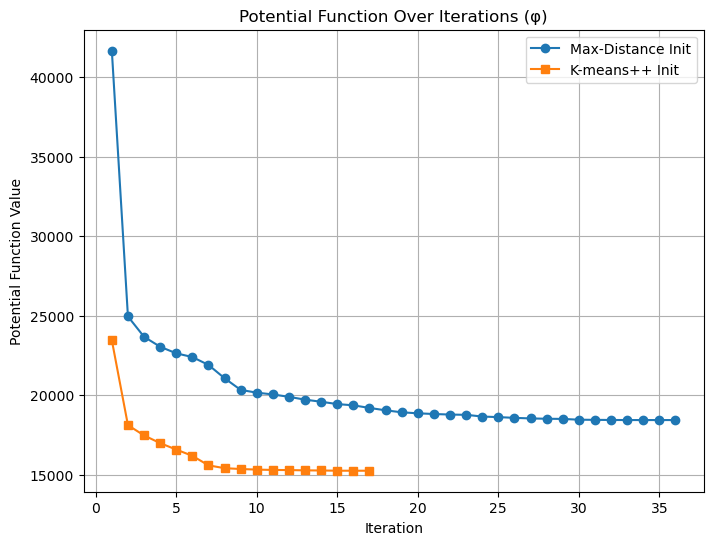

In [17]:
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(phi_values_max_dist) + 1), phi_values_max_dist, marker='o', label='Max-Distance Init')
plt.plot(range(1, len(phi_values_kmeans_pp) + 1), phi_values_kmeans_pp, marker='s', label='K-means++ Init')
plt.title('Potential Function Over Iterations (\u03C6)')
plt.xlabel('Iteration')
plt.ylabel('Potential Function Value')
plt.grid()
plt.legend()
plt.show()

Silhouette Score for Max-Distance Initialization: 0.4721


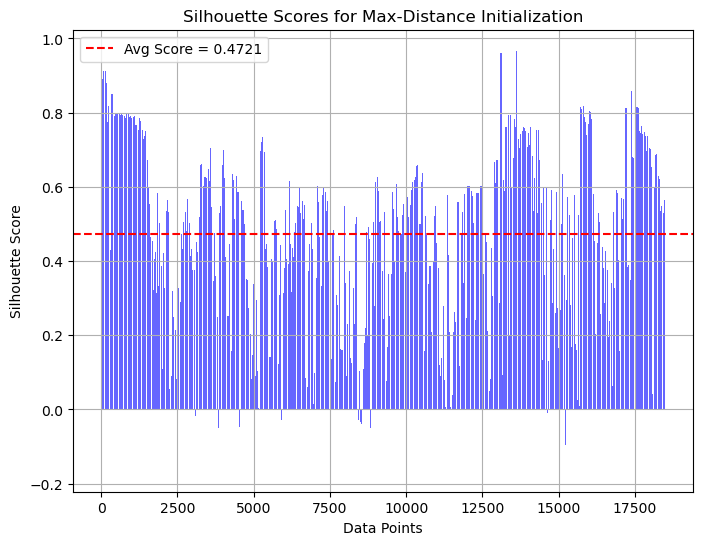

Silhouette Score for K-means++ Initialization: 0.4352


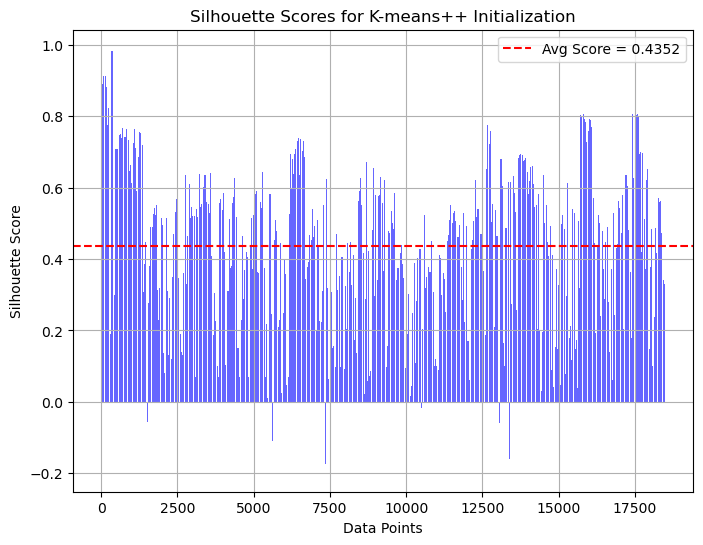

In [25]:
# Silhouette Score Visualizations
plot_silhouette_score(filtered_data_array, labels_max_dist, "Max-Distance Initialization")
plot_silhouette_score(filtered_data_array, labels_kmeans_pp, "K-means++ Initialization")